In [1]:


# Install necessary libraries
!pip install -q --upgrade scikit-learn==1.1.3 imbalanced-learn==0.10.1

#  Imports
import os, random, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt  
import seaborn as sns 


from tensorflow.keras.preprocessing.image import load_img, img_to_array

from tensorflow.keras.applications import (
    VGG16, VGG19, MobileNetV3Large, ResNet50V2,
    InceptionResNetV2, DenseNet121, DenseNet169, DenseNet201,
    InceptionV3, EfficientNetB0, Xception
)

from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam


from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.metrics import (
    classification_report, accuracy_score, precision_score,
    recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc,
    cohen_kappa_score, matthews_corrcoef
)

from imblearn.metrics import geometric_mean_score, specificity_score


warnings.filterwarnings("ignore")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.0/32.0 MB 53.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.0/226.0 kB 9.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
sklearn-compat 0.1.3 requires scikit-learn<1.7,>=1.2, but you have scikit-learn 1.1.3 which is incompatible.
mlxtend 0.23.4 requires scikit-learn>=1.3.1, but you have scikit-learn 1.1.3 which is incompatible.


2025-07-14 05:47:30.437242: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752472050.835208      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752472050.950659      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:

real_path = "/kaggle/input/images-dataset/real_and_fake_face/training_real" 
fake_path = "/kaggle/input/images-dataset/real_and_fake_face/training_fake"

def load_images(folder, label):
    images, labels = [], []
    for filename in os.listdir(folder):
        path = os.path.join(folder, filename)
        try:
            img = load_img(path, target_size=(224, 224))  
            img = img_to_array(img) / 255.0  
            images.append(img)
            labels.append(label) 
        except:
            print("Error loading:", path)
    return np.array(images), np.array(labels)

real_imgs, real_labels = load_images(real_path, 1)
fake_imgs, fake_labels = load_images(fake_path, 0)

X = np.concatenate([real_imgs, fake_imgs])
y = np.concatenate([real_labels, fake_labels])
X, y = shuffle(X, y, random_state=42)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [3]:


def build_model(base_model_fn):
    base = base_model_fn(weights='imagenet', include_top=False, input_shape=(224,224,3))
    for layer in base.layers:
        layer.trainable = False  
    x = GlobalAveragePooling2D()(base.output) 
    x = Dense(512, activation='relu')(x)  
    x = Dropout(0.5)(x)  
    output = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base.input, outputs=output)
    model.compile(optimizer=Adam(1e-4), loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [4]:

models_to_run = {
    "DenseNet201": DenseNet201,
    "InceptionV3": InceptionV3,
    "VGG16": VGG16,
    "VGG19": VGG19,
    "MobileNetV3Large": MobileNetV3Large,
    "ResNet50V2": ResNet50V2,
    "InceptionResNetV2": InceptionResNetV2,
    "DenseNet121": DenseNet121,
    "DenseNet169": DenseNet169,
    "EfficientNetB0": EfficientNetB0,
    "Xception": Xception
}

results = []  
all_fpr = {} 
all_tpr = {}
all_cm = {} 
model_predictions = {} 

for name, model_fn in models_to_run.items():
    print(f"\n🔧 Training model: {name}")
    model = build_model(model_fn)
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0) 

    y_pred = model.predict(X_test).ravel()  
    y_pred_bin = (y_pred > 0.5).astype(int)  

    
    acc = accuracy_score(y_test, y_pred_bin)
    prec = precision_score(y_test, y_pred_bin)
    rec = recall_score(y_test, y_pred_bin)
    f1 = f1_score(y_test, y_pred_bin)
    auc_score = roc_auc_score(y_test, y_pred)
    gmean = geometric_mean_score(y_test, y_pred_bin)
    spec = specificity_score(y_test, y_pred_bin)
    cm = confusion_matrix(y_test, y_pred_bin)
    kappa = cohen_kappa_score(y_test, y_pred_bin)
    mcc = matthews_corrcoef(y_test, y_pred_bin)
    type1 = 1 - spec
    type2 = 1 - rec

    results.append([name, acc, kappa, prec, rec, f1, auc_score, mcc, spec, gmean, type1, type2])
    all_cm[name] = cm
    model_predictions[name] = (y_pred_bin, model)

    fpr, tpr, _ = roc_curve(y_test, y_pred)
    all_fpr[name] = fpr
    all_tpr[name] = tpr


🔧 Training model: DenseNet201


I0000 00:00:1752472104.722713      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1752472104.723584      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


I0000 00:00:1752472143.345645     103 service.cc:148] XLA service 0x7889401edbf0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752472143.347268     103 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1752472143.347289     103 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1752472147.568257     103 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1752472167.124100     103 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


13/13 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step 

🔧 Training model: InceptionV3
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
13/13 ━━━━━━━━━━━━━━━━━━━━ 16s 839ms/step

🔧 Training model: VGG16
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
13/13 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step 

🔧 Training model: VGG19
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 307ms/step

🔧 Training model: MobileNetV3Large
12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
13/13 ━━━━━━━━━━━━━━━━━━━━ 11s 551ms/step

🔧 Training model: ResNet50V2
94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
13/13 ━━━━━━━━━━━━━━━━━━━━ 12s 678ms/step

🔧 Training model: InceptionResNetV2
219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
13/13 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step 

🔧 Training model: DenseNet121
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
13/13 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step

🔧 Training model: DenseNet169
51877672/51877672 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
13/13 ━━━━━━━━━━━━

In [5]:

columns = [
    "Model", "Accuracy", "Cohen-Kappa", "Precision", "Recall", "F1-Score",
    "AUROC", "MCC", "Specificity", "G-Mean", "Type I Error", "Type II Error"
]
result_df = pd.DataFrame(results, columns=columns)
result_df.to_csv("/kaggle/working/all_model_results.csv", index=False)

print("\n✅ Results saved to /kaggle/working/all_model_results.csv")
print(result_df.sort_values(by='AUROC', ascending=False))


✅ Results saved to /kaggle/working/all_model_results.csv
                Model  Accuracy  Cohen-Kappa  Precision    Recall  F1-Score  \
5          ResNet50V2  0.660147     0.321514   0.716418  0.637168  0.674473   
2               VGG16  0.635697     0.271206   0.687805  0.623894  0.654292   
8         DenseNet169  0.652812     0.297132   0.684211  0.690265  0.687225   
3               VGG19  0.655257     0.298063   0.677824  0.716814  0.696774   
7         DenseNet121  0.625917     0.248550   0.671362  0.632743  0.651481   
0         DenseNet201  0.633252     0.261377   0.674312  0.650442  0.662162   
1         InceptionV3  0.635697     0.253549   0.653386  0.725664  0.687631   
10           Xception  0.623472     0.256311   0.700000  0.557522  0.620690   
6   InceptionResNetV2  0.594132     0.174039   0.626050  0.659292  0.642241   
4    MobileNetV3Large  0.552567     0.003435   0.553350  0.986726  0.709062   
9      EfficientNetB0  0.552567     0.000000   0.552567  1.000000  0.7118

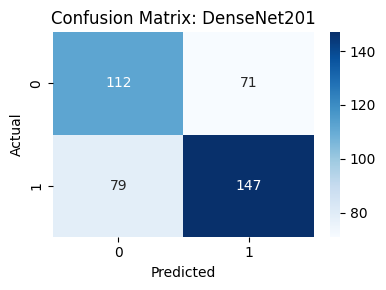

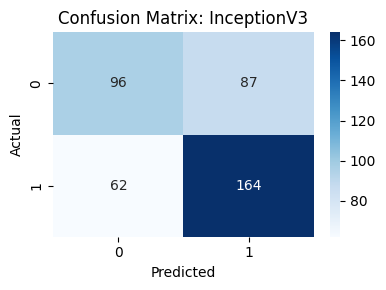

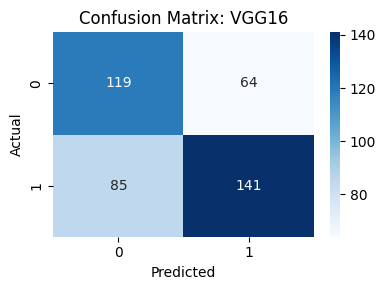

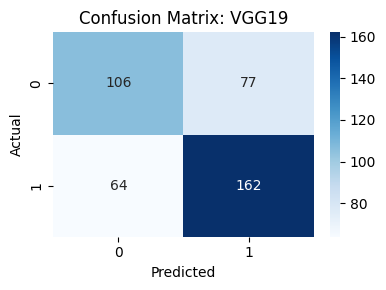

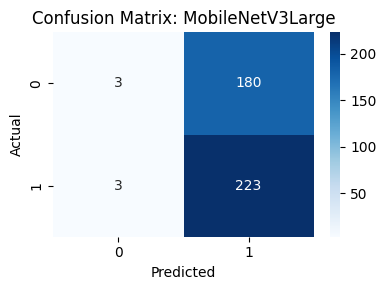

...

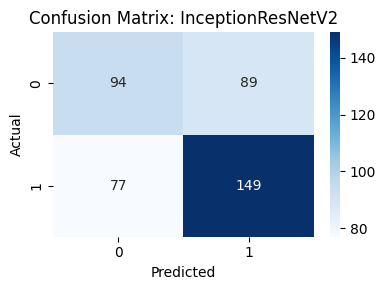

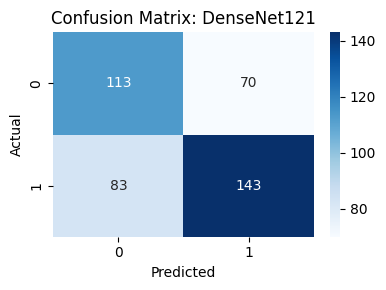

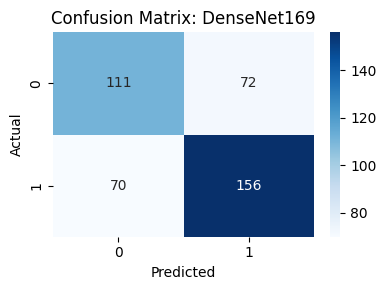

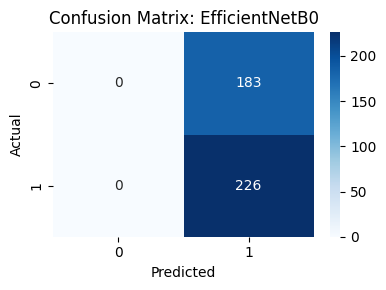

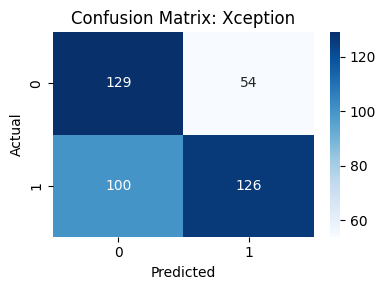

In [6]:

for name, cm in all_cm.items():
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Confusion Matrix: {name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()


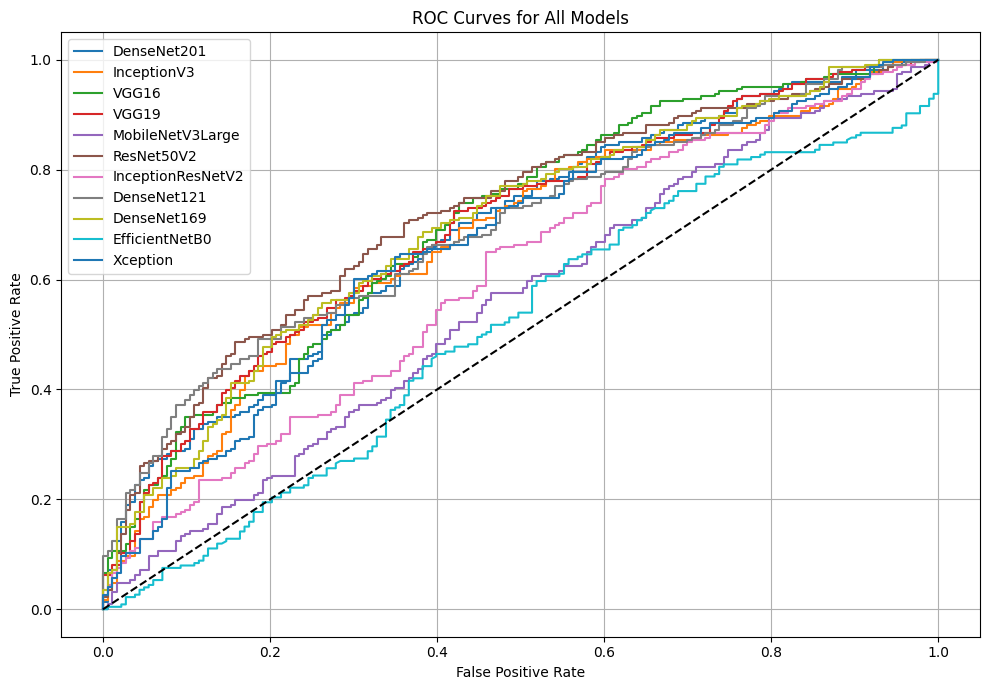

In [7]:

plt.figure(figsize=(10, 7))
for name in all_fpr:
    plt.plot(all_fpr[name], all_tpr[name], label=f"{name}")

plt.plot([0, 1], [0, 1], 'k--')
plt.title("ROC Curves for All Models")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


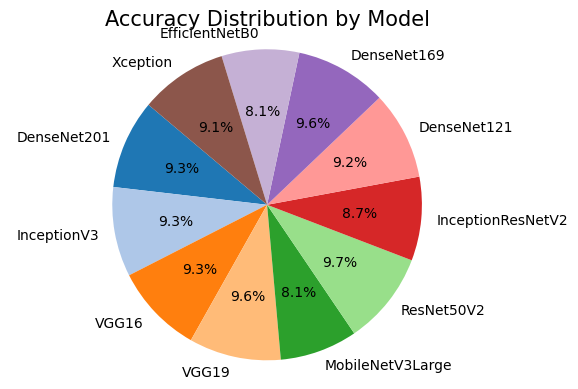

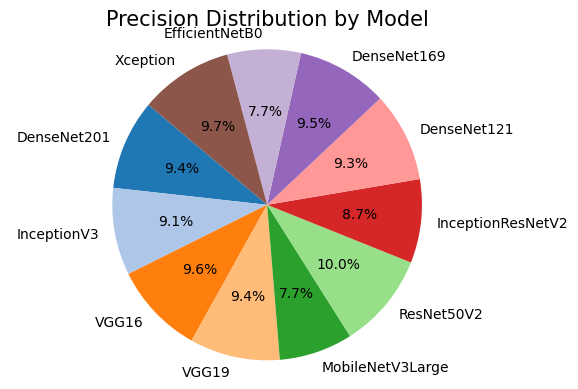

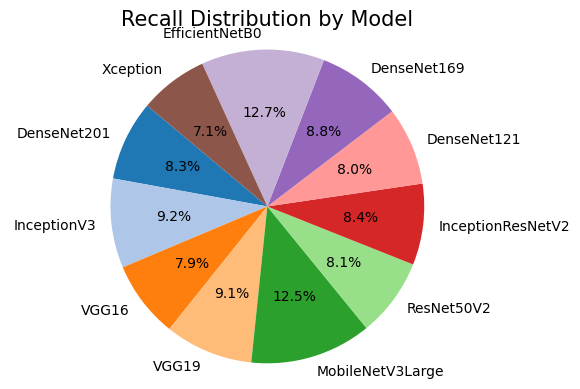

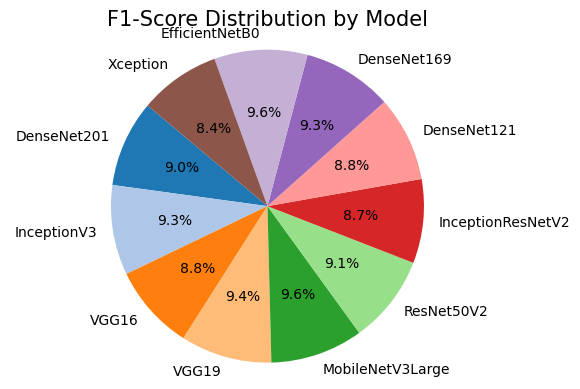

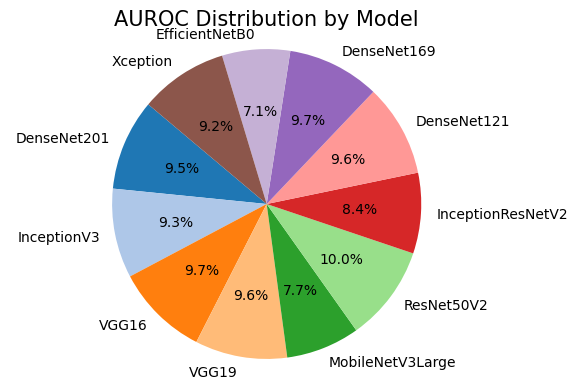

...

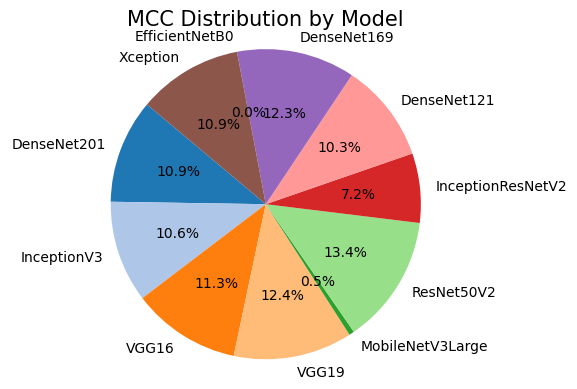

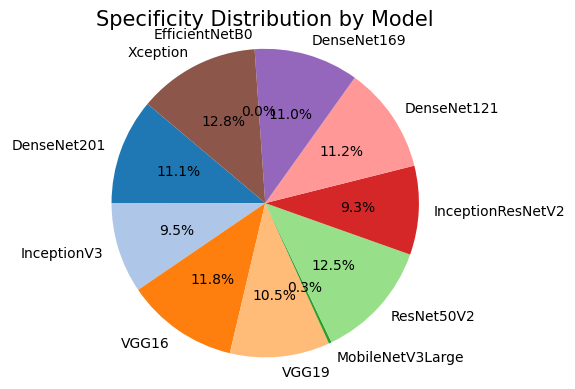

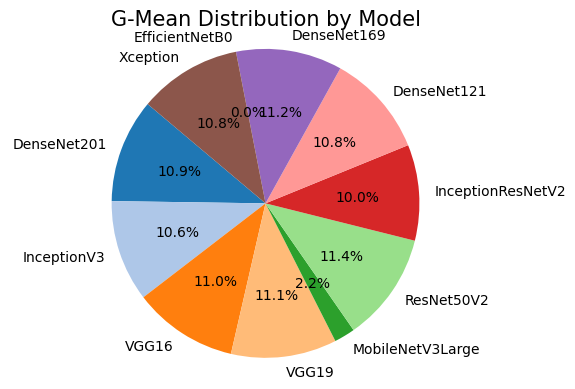

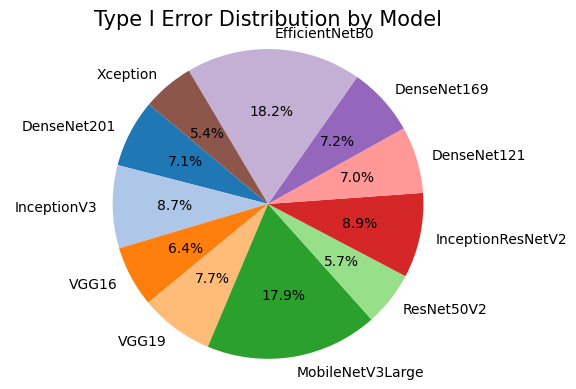

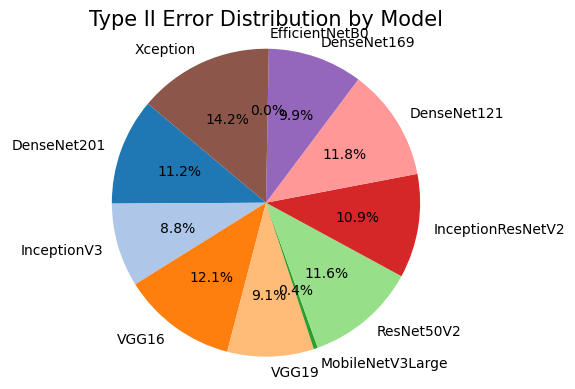

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("/kaggle/working/all_model_results.csv")  # বা local path

metrics = [
    "Accuracy", "Precision", "Recall", "F1-Score", "AUROC",
    "Cohen-Kappa", "MCC", "Specificity", "G-Mean",
    "Type I Error", "Type II Error"
]

for metric in metrics:
    plt.figure(figsize=(6, 4))
    plt.pie(
        df[metric],
        labels=df['Model'],
        autopct='%1.1f%%',
        startangle=140,
        colors=plt.cm.tab20.colors
    )
    plt.title(f"{metric} Distribution by Model", fontsize=15)
    plt.axis('equal') 
    plt.tight_layout()
    plt.show()



🔍 Visualizing 5 Misclassified Images by ResNet50V2:


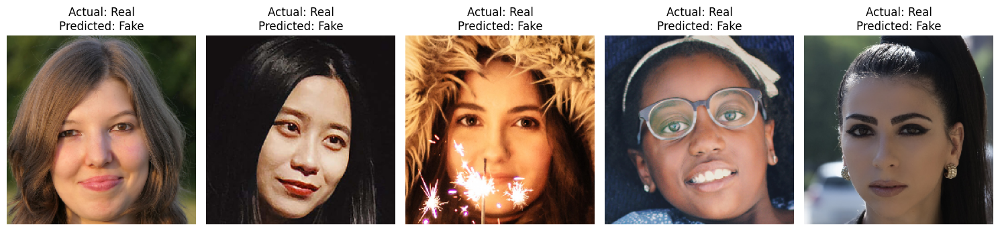

In [8]:

#  Best Model
best_model_name = result_df.sort_values(by='AUROC', ascending=False).iloc[0]['Model']
y_pred_best, best_model = model_predictions[best_model_name]

misclassified_idxs = np.where(y_test != y_pred_best)[0]

# Top 5 wrong prediction visualization
print(f"\n🔍 Visualizing 5 Misclassified Images by {best_model_name}:")
plt.figure(figsize=(15, 5))
for i, idx in enumerate(misclassified_idxs[:5]):
    plt.subplot(1, 5, i+1)
    plt.imshow(X_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {'Real' if y_test[idx]==1 else 'Fake'}\nPredicted: {'Real' if y_pred_best[idx]==1 else 'Fake'}")
plt.tight_layout()
plt.show()


✅ Visualizing 5 Correctly Classified Images by ResNet50V2:


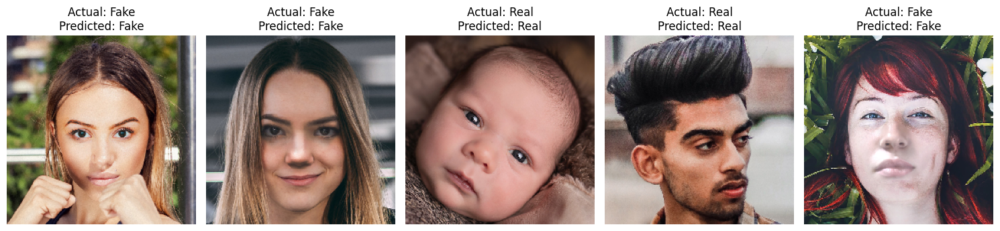

In [9]:
# ✅ Correctly classified indices
correct_idxs = np.where(y_test == y_pred_best)[0]

# ✅ Top 5 True Prediction visualization
print(f"\n✅ Visualizing 5 Correctly Classified Images by {best_model_name}:")
plt.figure(figsize=(15, 5))
for i, idx in enumerate(correct_idxs[:5]):
    plt.subplot(1, 5, i+1)
    plt.imshow(X_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {'Real' if y_test[idx]==1 else 'Fake'}\nPredicted: {'Real' if y_pred_best[idx]==1 else 'Fake'}")
plt.tight_layout()
plt.show()



✅ Visualizing 5 Correctly Classified Images by <function InceptionV3 at 0x788acea67880>:


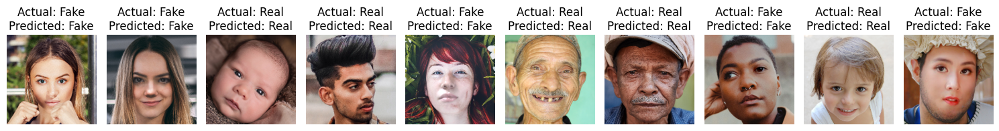

In [10]:
# ✅ Correctly classified indices
correct_idxs = np.where(y_test == y_pred_best)[0]

# ✅ Top 5 Trueb Prrdiction visualization
print(f"\n✅ Visualizing 5 Correctly Classified Images by {InceptionV3}:")
plt.figure(figsize=(15, 5))
for i, idx in enumerate(correct_idxs[:10]):
    plt.subplot(1, 10, i+1)
    plt.imshow(X_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {'Real' if y_test[idx]==1 else 'Fake'}\nPredicted: {'Real' if y_pred_best[idx]==1 else 'Fake'}")
plt.tight_layout()
plt.show()



❌ Visualizing 10 Misclassified Images by DenseNet201:


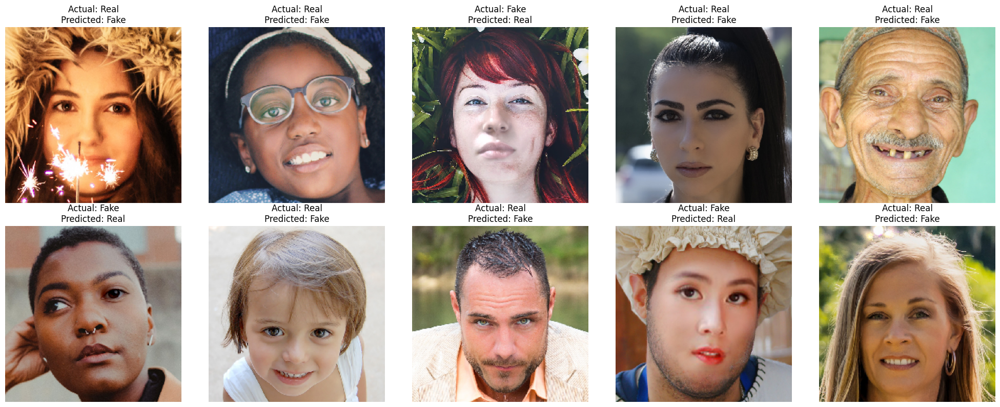

In [11]:

chosen_model_name = 'DenseNet201'
y_pred_chosen, chosen_model = model_predictions[chosen_model_name]

# ❌ Misclassified indices
misclassified_idxs = np.where(y_test != y_pred_chosen)[0]

# ❌ Visualization of 10 Misclassified Images
print(f"\n❌ Visualizing 10 Misclassified Images by {chosen_model_name}:")
plt.figure(figsize=(20, 8))
for i, idx in enumerate(misclassified_idxs[:10]):
    plt.subplot(2, 5, i+1)
    plt.imshow(X_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {'Real' if y_test[idx]==1 else 'Fake'}\nPredicted: {'Real' if y_pred_chosen[idx]==1 else 'Fake'}")
plt.tight_layout()
plt.show()



✅ Model: DenseNet201
✔️ Total Correct: 259
❌ Total Misclassified: 150

✅ Visualizing 10 Correctly Classified Images by DenseNet201:


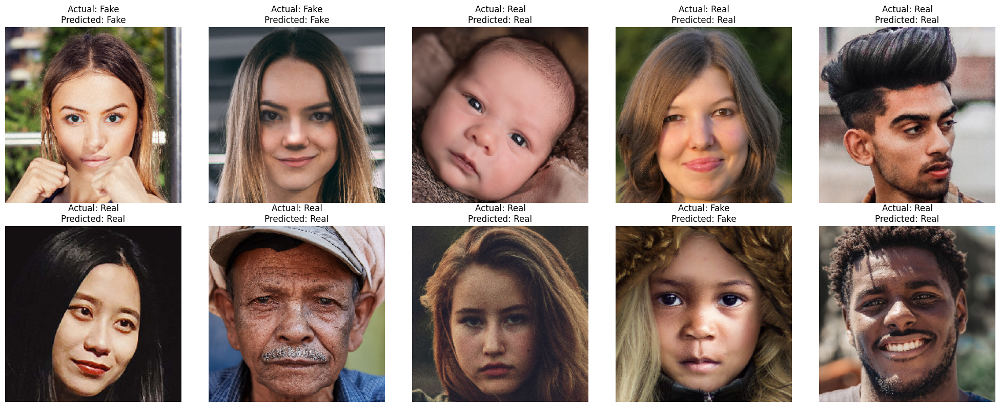


❌ Visualizing 10 Misclassified Images by DenseNet201:


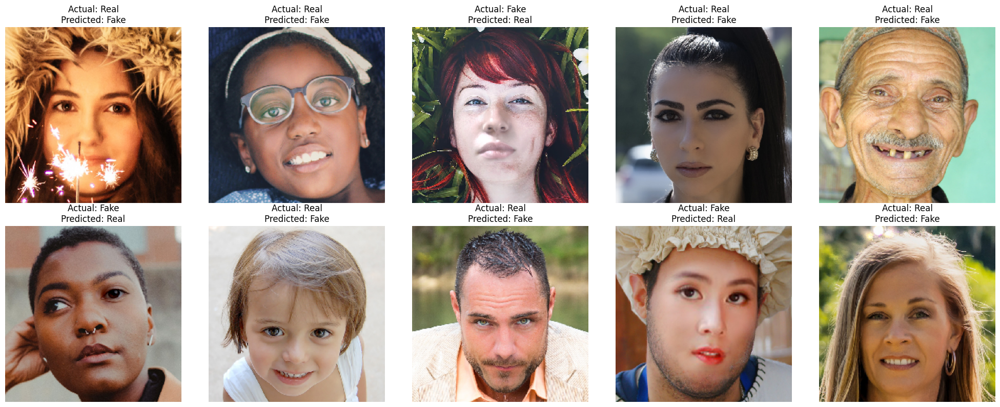


🔀 Visualizing Mixed (10 Correct + 10 Misclassified) Images by DenseNet201:


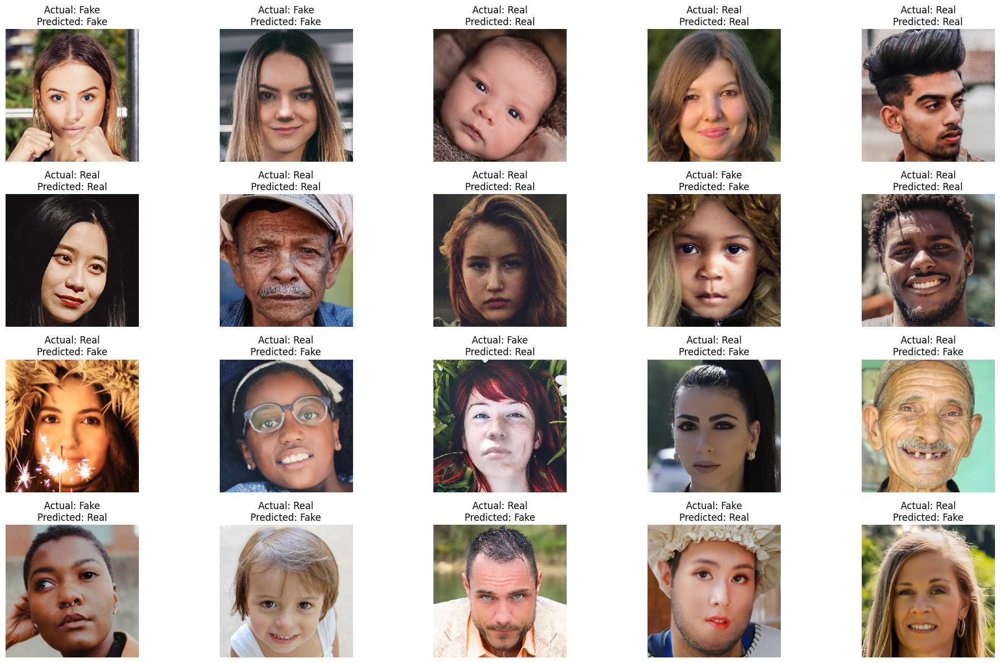

In [12]:

chosen_model_name = 'DenseNet201'

y_pred_chosen, chosen_model = model_predictions[chosen_model_name]

correct_idxs = np.where(y_test == y_pred_chosen)[0]
misclassified_idxs = np.where(y_test != y_pred_chosen)[0]

print(f"\n✅ Model: {chosen_model_name}")
print(f"✔️ Total Correct: {len(correct_idxs)}")
print(f"❌ Total Misclassified: {len(misclassified_idxs)}")

# ✅✅ Step 4: 10 Correctly Classified Images
print(f"\n✅ Visualizing 10 Correctly Classified Images by {chosen_model_name}:")
plt.figure(figsize=(20, 8))
for i, idx in enumerate(correct_idxs[:10]):
    plt.subplot(2, 5, i+1)
    plt.imshow(X_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {'Real' if y_test[idx]==1 else 'Fake'}\nPredicted: {'Real' if y_pred_chosen[idx]==1 else 'Fake'}")
plt.tight_layout()
plt.show()

# ✅✅ Step 5: 10 Misclassified Images
print(f"\n❌ Visualizing 10 Misclassified Images by {chosen_model_name}:")
plt.figure(figsize=(20, 8))
for i, idx in enumerate(misclassified_idxs[:10]):
    plt.subplot(2, 5, i+1)
    plt.imshow(X_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {'Real' if y_test[idx]==1 else 'Fake'}\nPredicted: {'Real' if y_pred_chosen[idx]==1 else 'Fake'}")
plt.tight_layout()
plt.show()

# ✅✅✅ Step 6: Mixed: 10 Correct + 10 Misclassified together
print(f"\n🔀 Visualizing Mixed (10 Correct + 10 Misclassified) Images by {chosen_model_name}:")
mixed_idxs = list(correct_idxs[:10]) + list(misclassified_idxs[:10])

plt.figure(figsize=(20, 12))
for i, idx in enumerate(mixed_idxs):
    plt.subplot(4, 5, i+1)
    plt.imshow(X_test[idx])
    plt.axis('off')
    plt.title(f"Actual: {'Real' if y_test[idx]==1 else 'Fake'}\nPredicted: {'Real' if y_pred_chosen[idx]==1 else 'Fake'}")
plt.tight_layout()
plt.show()